In [59]:
#Necessary Imports
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas_profiling
pd.options.display.float_format = '{:.2f}'.format #Turning off scientific notations

In [60]:
#Data Ingestion
os.chdir("E:/Springboard/Github/Springboard_Projects")
df=pd.read_csv("E:/Springboard/Capstone 2/data sets/zomato_restaurants_in_india.csv")
print(df.shape)
df.head(1).T

(211944, 26)


,0
res_id,3400299
name,Bikanervala
establishment,['Quick Bites']
url,https://www.zomato.com/agra/bikanervala-khanda...
address,"Kalyani Point, Near Tulsi Cinema, Bypass Road,..."
city,Agra
city_id,34
locality,Khandari
latitude,27.21
longitude,78.00


In [61]:
profile_report = df.profile_report(explorative=True, html={'style': {'full_width': True}})
profile_report

In [62]:
df.columns

Index(['res_id', 'name', 'establishment', 'url', 'address', 'city', 'city_id',
       'locality', 'latitude', 'longitude', 'zipcode', 'country_id',
       'locality_verbose', 'cuisines', 'timings', 'average_cost_for_two',
       'price_range', 'currency', 'highlights', 'aggregate_rating',
       'rating_text', 'votes', 'photo_count', 'opentable_support', 'delivery',
       'takeaway'],
      dtype='object')

In [63]:
df.isnull().sum() #looks like zip code column should be dropped

res_id                       0
name                         0
establishment                0
url                          0
address                    134
city                         0
city_id                      0
locality                     0
latitude                     0
longitude                    0
zipcode                 163187
country_id                   0
locality_verbose             0
cuisines                  1391
timings                   3874
average_cost_for_two         0
price_range                  0
currency                     0
highlights                   0
aggregate_rating             0
rating_text                  0
votes                        0
photo_count                  0
opentable_support           48
delivery                     0
takeaway                     0
dtype: int64

In [64]:
df.isnull().sum()/len(df['res_id']) #Timings and Cuisines have 2% and 1% Missing values so retaining them

res_id                 0.00
name                   0.00
establishment          0.00
url                    0.00
address                0.00
city                   0.00
city_id                0.00
locality               0.00
latitude               0.00
longitude              0.00
zipcode                0.77
country_id             0.00
locality_verbose       0.00
cuisines               0.01
timings                0.02
average_cost_for_two   0.00
price_range            0.00
currency               0.00
highlights             0.00
aggregate_rating       0.00
rating_text            0.00
votes                  0.00
photo_count            0.00
opentable_support      0.00
delivery               0.00
takeaway               0.00
dtype: float64

In [65]:
df['zipcode']=df['zipcode'].astype('object')

In [66]:
df['zipcode'].value_counts(dropna=False).head(20) #163187 Missing Values + 9857 values are 0 which is not possible. 
# I can use city, locality, longitude and latitude instead of zipcode, so I am dropping zipcode

NaN       163187
0           9857
482001       918
313001       750
305001       578
226010       539
248001       491
605001       459
603203       444
482002       443
800001       382
143001       378
305022       321
600024       316
395007       306
144001       303
600017       274
600028       268
403001       259
492001       253
Name: zipcode, dtype: int64

In [67]:
df=df.drop_duplicates(subset='res_id') 
#Dropped duplicates on the basis of res_id as res_id is unique for every restaurant and for each branch
df.shape

(55568, 26)

In [68]:
df['name'].value_counts().head(30)

Domino's Pizza            399
Cafe Coffee Day           315
KFC                       204
Baskin Robbins            202
Keventers                 189
Subway                    178
McDonald's                130
Pizza Hut                 125
Barbeque Nation           112
Burger King               110
Monginis                  106
The Chocolate Room         72
Giani's                    71
The Belgian Waffle Co.     69
Frozen Bottle              68
ibaco                      65
Lassi Shop                 60
Kanti Sweets               59
Behrouz Biryani            59
Green Chick Chop           56
Natural Ice Cream          51
The London Shakes          51
Drunken Monkey             48
Cream Stone                47
WOW! Momo                  46
Polar Bear                 46
Punjabi Dhaba              43
Bikanervala                39
La Pino'z Pizza            38
Indian Coffee House        37
Name: name, dtype: int64

In [69]:
df=df.drop('zipcode', axis=1)

In [70]:
df.head(2).T

,0,1
res_id,3400299,3400005
name,Bikanervala,Mama Chicken Mama Franky House
establishment,['Quick Bites'],['Quick Bites']
url,https://www.zomato.com/agra/bikanervala-khanda...,https://www.zomato.com/agra/mama-chicken-mama-...
address,"Kalyani Point, Near Tulsi Cinema, Bypass Road,...","Main Market, Sadar Bazaar, Agra Cantt, Agra"
city,Agra,Agra
city_id,34,34
locality,Khandari,Agra Cantt
latitude,27.21,27.16
longitude,78.00,78.01


In [71]:
# [] to be removed from establishment.
# cuisines column --- str.split to extract all cuisines
# highlights too -- str.split
# timings -- check levels (decide if dummies creation to be done or to be dropped)
#rating_text, cuisine, highlights -- wordcloud

#Other columns to be dropped:
#res_id (identifier column, not much use of it)
#url (website not required for analysis, even if i encode it, all values will be 1)
#country_id (all restaurants are in india only, so no use for this column)
# address, locality_verbose can be dropped as well. (redundant since locality and city are there)
#currency to be dropped (obv its INR)
#city_id to be dropped as I have city
#Let's drop these and check the data further.
#Not dropping name right now, as I want to see if any big restaurant brands are better rated than others or not.

In [72]:
df=df.drop(['res_id','url','country_id','currency', 'address', 'locality_verbose','city_id'],axis=1)

In [73]:
# df.highlights=df.highlights.str.replace("''", " ")
# df.highlights=df.highlights.str.replace("[ ]", " ")

In [74]:
# df.highlights
# profile_report_h = df[['highlights']].profile_report(explorative=True, html={'style': {'full_width': True}})
# profile_report_h

In [75]:
print(df.shape)
print('*******************************')
print(df.dtypes)

(55568, 18)
*******************************
name                     object
establishment            object
city                     object
locality                 object
latitude                float64
longitude               float64
cuisines                 object
timings                  object
average_cost_for_two      int64
price_range               int64
highlights               object
aggregate_rating        float64
rating_text              object
votes                     int64
photo_count               int64
opentable_support       float64
delivery                  int64
takeaway                  int64
dtype: object


In [76]:
#delivery and takeaway columns are categorical and are stored as int, so this needs to be fixed.
df['delivery']=df['delivery'].astype(object)
df['takeaway']=df['takeaway'].astype(object)

In [77]:
df['delivery'].value_counts() #Why -1? 

-1    37346
 1    17907
 0      315
Name: delivery, dtype: int64

In [78]:
df['takeaway'].value_counts()  #Why -1?

-1    55568
Name: takeaway, dtype: int64

In [79]:
df['price_range']=df['price_range'].astype(object)


In [80]:
df['price_range'].value_counts(dropna=False) #What is 1,2,3,4?

1    28818
2    16582
3     7370
4     2798
Name: price_range, dtype: int64

In [81]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,55568.00,21.45,42.90,0.00,16.52,22.47,26.75,10000.00
longitude,55568.00,76.50,10.98,0.00,74.65,77.11,79.83,91.83
average_cost_for_two,55568.00,528.21,595.03,0.00,200.00,350.00,600.00,30000.00
aggregate_rating,55568.00,2.96,1.46,0.00,2.90,3.50,3.90,4.90
votes,55568.00,223.33,618.22,-18.00,6.00,35.00,175.00,42539.00
photo_count,55568.00,160.97,586.98,0.00,1.00,10.00,69.00,17702.00
opentable_support,55556.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [82]:
#opentable_support has all 0 values and has 48 missing values----> Not much use, so dropping it.
#res_id is the identifier, so to be dropped.
#latitude has a max value of 10000 which is not possible. (range of latitude is -90 to +90)
#Longitude max is 91.83, longitude range is -90 to +90. 
#country_id can be dropped as restaurant data is of india only.
#average_cost_for_two=30000???? and minimum 0?? why would a restaurant sell for free?? check?
#-18 min value for votes, check.. does -1 mean downvote?
#price_range is in the range 1 to 4.9, check?

In [83]:
df=df.drop('opentable_support', axis=1)

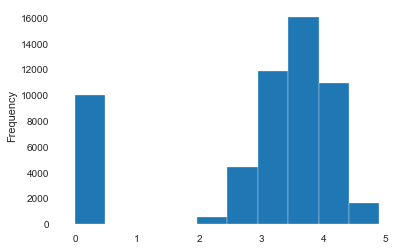

In [84]:
df['aggregate_rating'].plot(kind='hist') 
#Seems normal distribution like, but why is rating 0? Maybe its unrated and submitted.
#1 rating is blank, check!

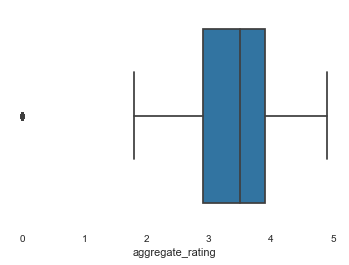

In [85]:
sns.boxplot(df['aggregate_rating'])
plt.show()#Looks like 0 means unrated

In [86]:
df[df['aggregate_rating']==0] # Aggregate_Rating = 0 is not rated, confirmed with rating_text

,name,establishment,city,locality,latitude,longitude,cuisines,timings,average_cost_for_two,price_range,highlights,aggregate_rating,rating_text,votes,photo_count,delivery,takeaway
103,Skydeck - The Gateway Hotel,['Fine Dining'],Agra,"The Gateway Hotel, Tajganj",27.16,78.04,"North Indian, Chinese, Continental",24 Hours (Mon-Sun),5500,4,"['Dinner', 'Lunch', 'Credit Card', 'Breakfast'...",0.00,Not rated,3,4,-1,-1
114,The Roof Top - Four Points By Sheraton,['Fine Dining'],Agra,"Four Points by Sheraton Agra, Tajganj",27.16,78.05,"Continental, Mughlai",7 PM to 11:30 PM,3000,4,"['Debit Card', 'Credit Card', 'Dinner', 'Cash'...",0.00,Not rated,0,2,-1,-1
132,The Tequila - Mansingh Palace,['Bar'],Agra,"Mansingh Palace, Tajganj",27.16,78.04,Finger Food,12 Noon to 11:30 PM (Mon-Sun),2000,4,"['Cash', 'Lunch', 'Serves Alcohol', 'Debit Car...",0.00,Not rated,2,5,-1,-1
133,The Bar - Trident Hotel,['Bar'],Agra,"Trident Hotel, Tajganj",27.16,78.06,Finger Food,12 Noon to 12 Midnight (Mon-Sun),2000,4,"['Serves Alcohol', 'Debit Card', 'Cash', 'Cred...",0.00,Not rated,3,0,-1,-1
134,Shahenshah,['Casual Dining'],Agra,Rakabganj,27.17,78.01,"Asian, South Indian, Continental, Chinese, Nor...","7 AM to 10:30 AM, 12 Noon to 3 PM, 7 PM to 10:...",2000,4,"['Lunch', 'Dinner', 'Cash', 'Takeaway Availabl...",0.00,Not rated,1,0,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210590,K.G.N Hotel,['Bhojanalya'],Vadodara,Karelibaug,22.31,73.20,North Indian,11 AM to 11:30 PM,200,1,"['Dinner', 'Cash', 'Lunch', 'Takeaway Availabl...",0.00,Not rated,1,1,-1,-1
210592,Super Rajni Dosa,['Bhojanalya'],Vadodara,Vadiwadi,22.31,73.16,"North Indian, Chinese, Fast Food, South Indian",9 AM to 11 PM,250,1,"['Lunch', 'Breakfast', 'Takeaway Available', '...",0.00,Not rated,2,0,-1,-1
210593,Jay Jalaram Bhojanalay,['Bhojanalya'],Vadodara,Nizampura,22.35,73.18,Gujarati,"11:30 AM to 2 PM, 7:30 PM to 9:30 PM",200,1,"['Dinner', 'Takeaway Available', 'Lunch', 'Cas...",0.00,Not rated,0,0,-1,-1
210594,Jay Jalaram Bhojanalay,['Bhojanalya'],Vadodara,Sama,22.35,73.18,Gujarati,"11:30 AM to 2 PM, 7:30 PM to 9:30 PM",200,1,"['Takeaway Available', 'Cash', 'Lunch', 'Dinne...",0.00,Not rated,0,0,-1,-1


In [87]:
df['city'].value_counts(dropna=False).head(30) 

Bangalore       2247
Mumbai          2022
Pune            1843
Chennai         1827
New Delhi       1704
Jaipur          1395
Kolkata         1361
Ahmedabad       1247
Goa             1150
Lucknow         1135
Nagpur          1039
Indore          1026
Coimbatore       976
Surat            970
Vadodara         963
Ludhiana         948
Bhopal           906
Kochi            897
Agra             833
Hyderabad        822
Raipur           784
Kanpur           776
Dehradun         765
Bhubaneshwar     764
Udaipur          754
Guwahati         726
Jodhpur          702
Vizag            694
Patna            667
Ranchi           662
Name: city, dtype: int64

In [88]:
profile_report_f = df.profile_report(explorative=True, html={'style': {'full_width': True}})
profile_report_f

In [89]:
df['timings'].value_counts(dropna=False) #How do I find missing values? How do I standardise these?

11 AM to 11 PM                                                              7012
10 AM to 10 PM                                                              1726
11 AM to 10 PM                                                              1429
10 AM to 11 PM                                                              1184
11 AM to 11 PM (Mon-Sun)                                                    1021
                                                                            ... 
8 AM to 8 PM (Mon, Wed-Sun), Tue Closed                                        1
11 AM to 11:50 PM (Mon-Sun)                                                    1
12:30pm – 4pm, 6:30pm – 10:30pm (Mon-Sun)                                      1
10 AM to 2 PM, 6 PM to 11 PM (Mon-Sun)                                         1
11am – 11pm (Mon-Fri),10:30am – 11:30am (Sat),10:30am – 12midnight (Sun)       1
Name: timings, Length: 7741, dtype: int64

Exploring Highlights and Establishment variables using Text Analytics

In [90]:
# For cleaning highlights, cuisine, establishmant

# data.amenities = data.amenities.str.replace("[{}]", "") 

# amenity_one = data.amenities.str.get_dummies(sep = ",")

# data = pd.concat([data,amenity_one], axis=1).drop('amenities', axis = 1)


In [91]:
df.establishment[0].replace('[','').replace(']','').replace("'",'')

df.establishment=df.establishment.apply(lambda x:x.replace('[','').replace(']','').replace("'",''))

In [92]:
df['establishment'].value_counts()

Quick Bites        14032
Casual Dining      12270
Café                4123
Bakery              3741
Dessert Parlour     3675
Sweet Shop          2615
Beverage Shop       2440
                    1830
Fine Dining         1535
Food Court          1494
Bar                 1399
Dhaba               1282
Kiosk               1126
Food Truck           868
Lounge               820
Bhojanalya           632
Mess                 361
Pub                  357
Paan Shop            320
Confectionery        218
Butcher Shop         154
Club                 112
Microbrewery         110
Shack                 20
Cocktail Bar          16
Irani Cafe            14
Pop up                 4
Name: establishment, dtype: int64

In [93]:
df.highlights[0].replace('[','').replace(']','').replace("'",'')

df.highlights=df.highlights.apply(lambda x:x.replace('[','').replace(']','').replace("'",''))

In [94]:
df['highlights'].value_counts()

Dinner, Takeaway Available, Lunch, Cash, Indoor Seating                                                                                                                                                                                                            860
                                                                                                                                                                                                                                                                   716
Dinner, Delivery, Lunch, Cash, Takeaway Available, Indoor Seating                                                                                                                                                                                                  569
Takeaway Available, Cash, Indoor Seating, Desserts and Bakes                                                                                                                                                       

In [95]:
import nltk 
from nltk.corpus import stopwords
from collections import Counter
from wordcloud import WordCloud, STOPWORDS 

In [96]:
highlights_r = df[['highlights', 'aggregate_rating']]

In [97]:
highlights_r['aggregate_rating'].value_counts().head()

0.00    10058
3.90     3537
3.80     3428
3.70     3324
4.00     3307
Name: aggregate_rating, dtype: int64

In [98]:
rating_4plus = [i for i in highlights_r[highlights_r["aggregate_rating"]>=4]['highlights']]

In [99]:
len(rating_4plus), len(highlights_r) #22.6% restaurants have rating >=4

(12561, 55568)

In [100]:
four_plus= ' '.join(rating_4plus)

Word Cloud of Highlights for Rating>=4 !!


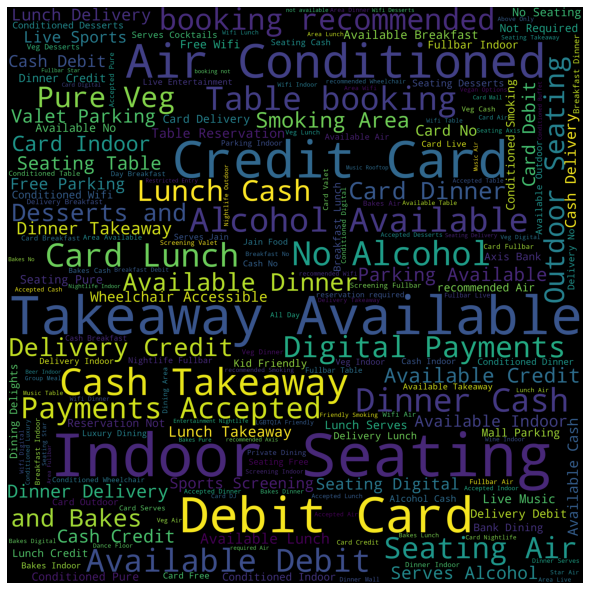

In [101]:
# Word Cloud 
wordcloud = WordCloud(width = 3000, height = 3000, 
                background_color ='black', 
                min_font_size = 10, random_state=100 ).generate(four_plus) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off")
plt.xlabel('Word Cloud')
plt.tight_layout(pad = 0) 

print("Word Cloud of Highlights for Rating>=4 !!")
plt.show()

In [102]:
# Most common words for Restaurants rated atleast 4 (no order)
# Indoor Seating, Debit card, Credit Card, Takeaway, Available, Payments Accepted, Cash, Air Conditioned,  
# Alcohol Available, Table Booking, Card, Lunch, Digital Payments

In [103]:
lessthanfour= [j for j in highlights_r[highlights_r["aggregate_rating"]<4]['highlights']]

In [104]:
below_four= ' '.join(lessthanfour)

Word Cloud of Highlights for Rating < 4 !!


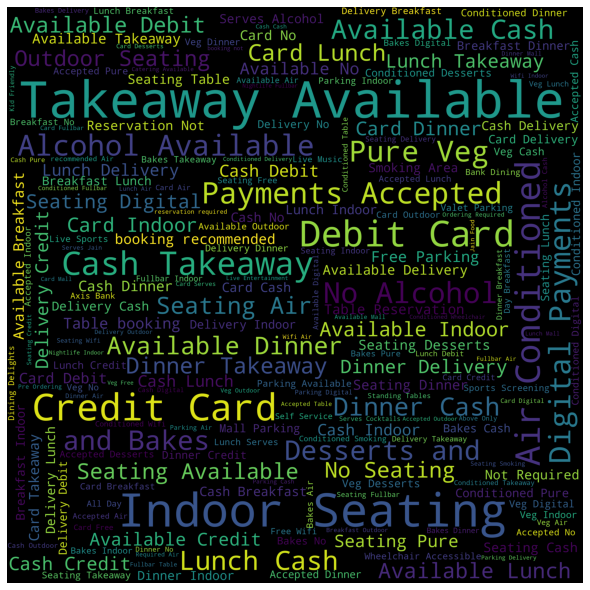

In [105]:
# Word Cloud 
wordcloud = WordCloud(width = 3000, height = 3000, 
                background_color ='black', 
                min_font_size = 10, random_state=100 ).generate(below_four) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off")
plt.xlabel('Word Cloud')
plt.tight_layout(pad = 0) 

print("Word Cloud of Highlights for Rating < 4 !!")
plt.show()

In [106]:
# Almost same words appear here too

In [107]:
estab_r = df[['establishment', 'aggregate_rating']]

In [108]:
est4 = [m for m in estab_r[estab_r["aggregate_rating"]>=4]['establishment']]
estab4 = ' '.join(est4)

Word Cloud of Establishment for Rating < 4 !!


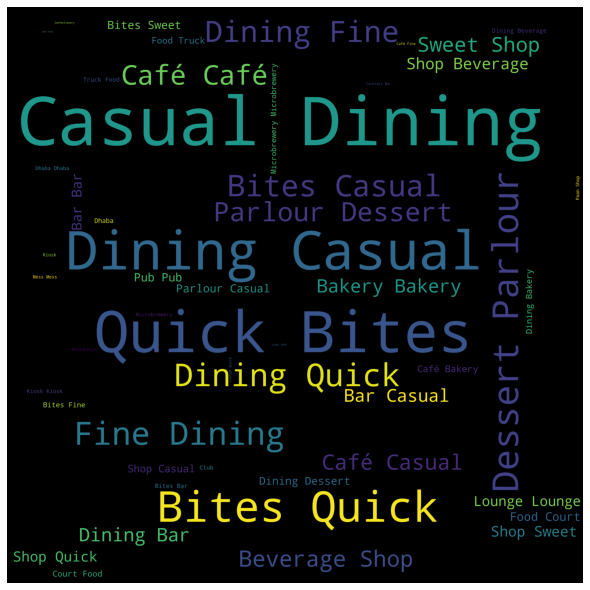

In [109]:
# Word Cloud 
wordcloud = WordCloud(width = 3000, height = 3000, 
                background_color ='black', 
                min_font_size = 10, random_state=100 ).generate(estab4) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off")
plt.xlabel('Word Cloud')
plt.tight_layout(pad = 0) 

print("Word Cloud of Establishment for Rating < 4 !!")
plt.show()

In [110]:
# Casual Dining, Quick Bites are more popular in restaurants rated 4 and above

In [111]:
est4_b = [m for m in estab_r[estab_r["aggregate_rating"]<4]['establishment']]
est_4_below = ' '.join(est4_b)

Word Cloud of Establishment for Rating < 4 !!


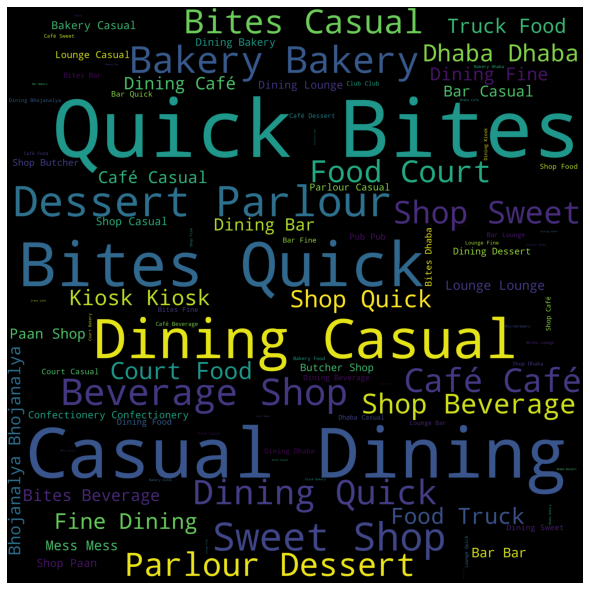

In [112]:
# Word Cloud 
wordcloud = WordCloud(width = 3000, height = 3000, 
                background_color ='black', 
                min_font_size = 10, random_state=100 ).generate(est_4_below) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off")
plt.xlabel('Word Cloud')
plt.tight_layout(pad = 0) 

print("Word Cloud of Establishment for Rating < 4 !!")
plt.show()

In [113]:
# More words in rating <4
# Besides Casual Dining and Quick Bites, there are Bakery, Beverage, Sweet Shop, Parlour Dessert,
# Sweet Shop, Food Court, DHaba etc

In [121]:
df['cuisines']=df['cuisines'].astype(str)

In [122]:
cuisines_r = df[['cuisines', 'aggregate_rating']]

In [123]:
cui4 = [m for m in cuisines_r[cuisines_r["aggregate_rating"]>=4]['cuisines']]
cuisine4 = ' '.join(cui4)

Word Cloud of Cuisines for Rating < 4 !!


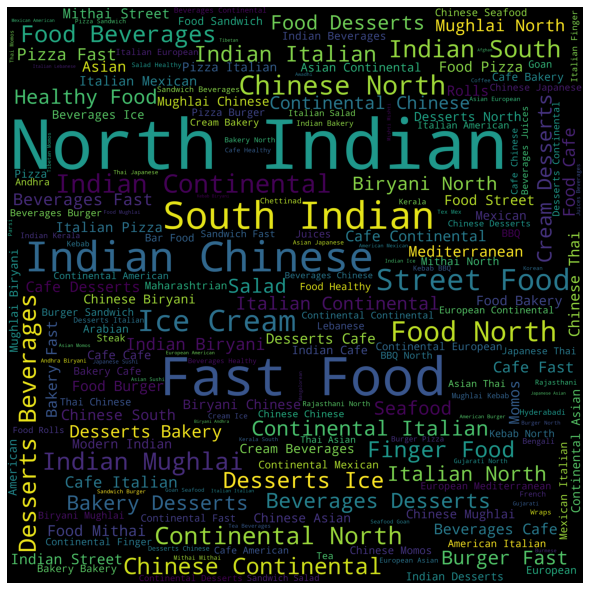

In [124]:
# Word Cloud 
wordcloud = WordCloud(width = 3000, height = 3000, 
                background_color ='black', 
                min_font_size = 10, random_state=100 ).generate(cuisine4) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off")
plt.xlabel('Word Cloud')
plt.tight_layout(pad = 0) 

print("Word Cloud of Cuisines for Rating < 4 !!")
plt.show()

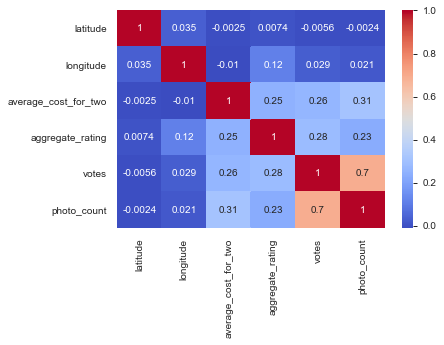

In [114]:
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.show() #Votes and photo_counts are highly correlated

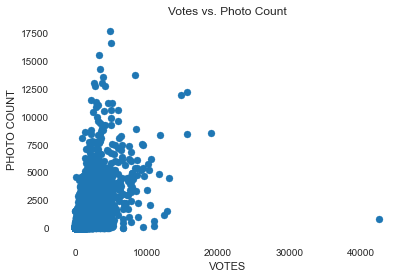

In [115]:
plt.scatter(df['votes'], df['photo_count'])
plt.xlabel('VOTES')
plt.ylabel('PHOTO COUNT')
plt.title('Votes vs. Photo Count')
plt.show() # Positive Relationship, corr of 0.7